In [1]:
import folium
import numpy as np
center_pos = [25.043, 121.539]
##創建第一張地圖
m = folium.Map(center_pos, zoom_start=13)
#radius 半徑大小, fill要不要填顏色, fill_color 甚麼顏色
folium.Circle(radius=1000,location=[25.04, 121.52],fill=True,fill_color="#3186cc").add_to(m)
folium.Marker([25.05, 121.56],icon=folium.Icon(color='red',icon='cloud')).add_to(m)
m

In [2]:
from folium.plugins import MarkerCluster


data =np.random.normal(size=(200, 2)) *np.array([[0.02, 0.02]]) +np.array([center_pos])
print(data)
cluster = folium.Map(center_pos, zoom_start=13)
cluster.add_child(MarkerCluster(data))

[[ 25.04809772 121.51066071]
 [ 25.0361404  121.51750946]
 [ 25.02267259 121.53339037]
 [ 25.05257275 121.54657237]
 [ 25.03085728 121.50238323]
 [ 25.01300421 121.5491706 ]
 [ 25.06971682 121.52600679]
 [ 25.02072912 121.53765534]
 [ 25.03416792 121.54187081]
 [ 25.05597891 121.56344975]
 [ 25.06400626 121.5213467 ]
 [ 24.99911586 121.55514756]
 [ 25.03487899 121.57088714]
 [ 25.03492889 121.57411316]
 [ 25.04190521 121.52230569]
 [ 25.02169965 121.50913892]
 [ 25.01160323 121.53347832]
 [ 24.99631912 121.53970607]
 [ 25.03079574 121.51201441]
 [ 25.02874808 121.50651084]
 [ 25.05846739 121.51116049]
 [ 25.03968919 121.53512568]
 [ 25.05862994 121.5345601 ]
 [ 25.02285234 121.51667761]
 [ 24.99111597 121.54020676]
 [ 25.04285537 121.57416189]
 [ 25.0419624  121.52001611]
 [ 25.00208903 121.56415933]
 [ 25.03813492 121.53214012]
 [ 25.04282158 121.49423293]
 [ 24.99301222 121.54419173]
 [ 25.07122621 121.51350277]
 [ 25.02747441 121.51183248]
 [ 25.02765981 121.55609852]
 [ 25.05439368

In [3]:
from folium.plugins import HeatMap
hm = folium.Map(location=center_pos,zoom_start = 13)
hm.add_child(HeatMap(data))
hm

In [4]:
from folium.plugins import HeatMapWithTime

center_pos = [25.04312, 121.53945]

# 使用 numpy 建立初始資料
initial_data = (np.random.normal(size=(200, 2)) *
                np.array([[0.06, 0.06]]) +
                np.array([center_pos]))
# 建立連續資料 變成200*2*21個時間點的資料
data_timeseies = [initial_data.tolist()]
for i in range(20):
    data_timeseies.append((data_timeseies[i] + np.random.normal(size=(200, 2)) * 0.001).tolist())

fmap = folium.Map(center_pos, zoom_start=13,tiles='cartodbdark_matter')
fmap.add_child(HeatMapWithTime(data_timeseies,auto_play = True)) # 顯示連續熱度圖
#fmap.save('timemap.html')

In [5]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point

In [6]:
tp_village = gpd.read_file(r'D:\GIS\Taipei\taipei_village.shp')
tp_village.head()

,VILLCODE,COUNTYNAME,TOWNNAME,VILLNAME,VILLENG,COUNTYID,COUNTYCODE,TOWNID,TOWNCODE,NOTE,geometry
0,63000080031,臺北市,文山區,樟新里,Zhangxin Vil.,A,63000,A11,63000080,None,"POLYGON ((121.55949 24.98021, 121.55907 24.980..."
1,63000080037,臺北市,文山區,老泉里,Laoquan Vil.,A,63000,A11,63000080,None,"POLYGON ((121.57152 24.98204, 121.57237 24.981..."
2,63000080032,臺北市,文山區,樟腳里,Zhangjiao Vil.,A,63000,A11,63000080,None,"POLYGON ((121.56908 24.98207, 121.56881 24.981..."
3,63000080041,臺北市,文山區,樟文里,Zhangwen Vil.,A,63000,A11,63000080,None,"POLYGON ((121.55995 24.98150, 121.55948 24.981..."
4,63000080043,臺北市,文山區,樟樹里,Zhangshu Vil.,A,63000,A11,63000080,None,"POLYGON ((121.56253 24.98209, 121.56196 24.981..."


In [7]:
tp_village.crs

<Geographic 2D CRS: EPSG:3824>
Name: TWD97
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: Taiwan
- bounds: (114.32, 17.36, 123.61, 26.96)
Datum: Taiwan Datum 1997
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

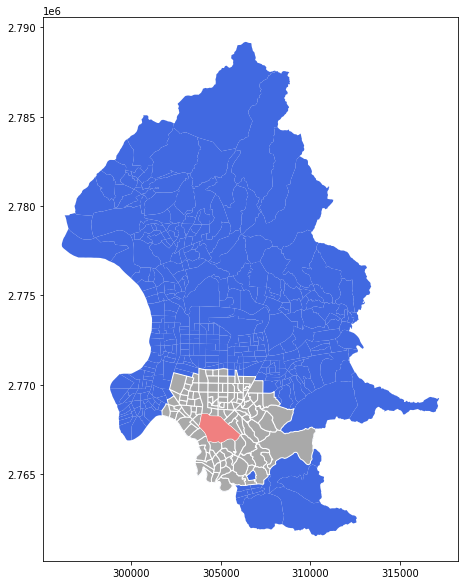

In [8]:
ntumap = tp_village[tp_village['VILLNAME'] == '學府里']
tp_village = tp_village.to_crs(epsg='3826')
ntumap = ntumap.to_crs(epsg='3826')

# Buffer Analysis
ntu_centroid = ntumap['geometry'].centroid
near_ntu = tp_village['geometry'].distance(ntu_centroid.values[0]) < 3000
near_ntu2 = tp_village[near_ntu]
fig, ax = plt.subplots(figsize = (12,10))
base = tp_village.plot(ax=ax, color="royalblue")
near_ntu2.plot(ax=ax, color="darkgrey", edgecolor="white")
ntumap.plot(ax=ax, color="lightcoral")


In [9]:
near_ntu2.crs

<Projected CRS: EPSG:3826>
Name: TWD97 / TM2 zone 121
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: Taiwan - 120°E to 122°E
- bounds: (119.99, 20.41, 122.06, 26.72)
Coordinate Operation:
- name: Taiwan 2-degree TM zone 121
- method: Transverse Mercator
Datum: Taiwan Datum 1997
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<AxesSubplot:>

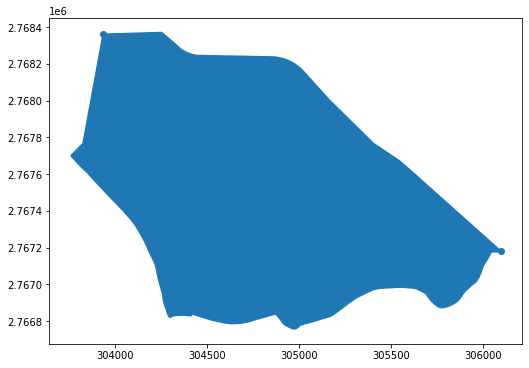

In [10]:
fig, ax = plt.subplots(figsize = (10,6))
gpd.clip(near_ntu2,ntumap).plot(ax=ax)

In [11]:
#讀取每個里的人口數
tp_pop=pd.read_excel(r'D:\GIS\Taipei\population.xlsx')
# 3826 (公尺) 才能算正確面積
tp_village = tp_village.merge(tp_pop, on='VILLNAME').to_crs(epsg=3826)
#平方公里
tp_village['Area'] = tp_village['geometry'].area/1000000
#換回原本座標系統
tp_village = tp_village.to_crs(epsg=4326)
##人口密度
tp_village['Density'] = tp_village.Total_population/tp_village.Area

<AxesSubplot:>

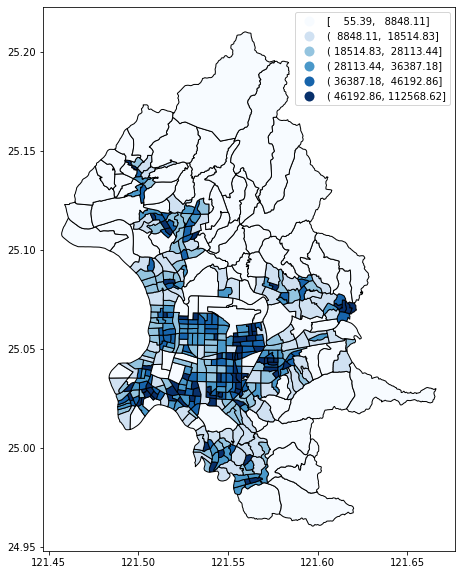

In [12]:
fig, ax = plt.subplots(figsize = (12,10))
tp_village.plot(ax=ax, column= 'Density',cmap='Blues',scheme = 'quantiles', edgecolor = 'black',k=6,legend=True)


In [13]:
import folium
m = folium.Map(
    location=[25.0431, 121.539723],
    zoom_start=13,
    tiles="OpenStreetMap"
)
# folium.Marker(
#     location=[25.052, 121.52],
#         popup='Cloud',
#     icon=folium.Icon(icon='cloud')
# ).add_to(m)



<AxesSubplot:>

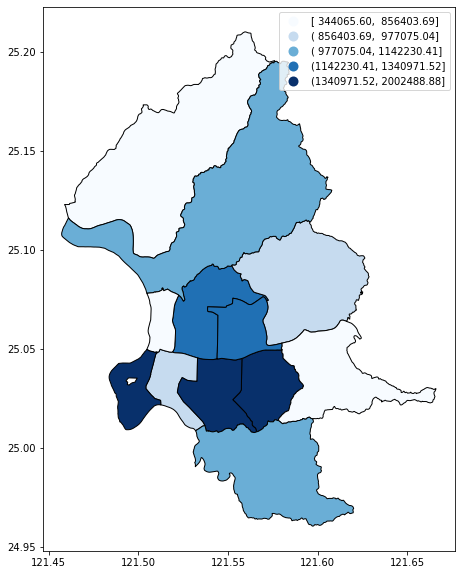

In [14]:
county = tp_village.dissolve(by='TOWNNAME',aggfunc='sum').reset_index()
fig, ax = plt.subplots(figsize = (12,10))
#county 
county.plot(ax=ax, column= 'Density',cmap='Blues',scheme = 'quantiles', edgecolor = 'black',k=5,legend=True)
#plt.savefig(r'D:\python\109-2 Programming\county_density.png')

In [15]:
import numpy as np
interval = []
#min(accident_vill['accident density'])
for i in range(6):
    interval.append(round(np.quantile(county['Density'],i/5),2))
interval

[344065.6, 856403.69, 977075.04, 1142230.41, 1340971.52, 2002488.88]

In [16]:
import branca.colormap as cmp
step = cmp.StepColormap(
 ['#F7FBFF', '#C6DBEF', '#6AAED6','#2070B4','#08306B'],
 vmin=interval[0], vmax=interval[-1],
 index=interval,  #for change in the colors, not used fr linear
 caption='Color Scale for Map'    #Caption for Color scale or Legend
)
step

In [17]:
import folium
TP_map = folium.Map(location=[25.043, 121.539], zoom_start=11)
folium.GeoJson(
    county,popup=folium.GeoJsonPopup(fields=['TOWNNAME']),
    style_function=lambda feature: {
        "fillColor":  step(feature["properties"]["Density"]),
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5",
        "fillOpacity": 0.9
    }
).add_to(TP_map)

step.caption = "Population Density (people/km2)"
step.add_to(TP_map)

TP_map

## 台北 交通事故資料探索

In [18]:
from shapely.geometry import Point
import pandas as pd 
df=pd.read_csv(r'D:\GIS\Taipei\taipei_accident.csv', encoding= 'utf-8-sig')
geom = [Point(xy) for xy in zip(df.X, df.Y)]
accident = gpd.GeoDataFrame(df, geometry=geom).set_crs(epsg=4326)

###  台大周圍的事故熱點圖

In [19]:
XY=[]
for i in range(len(df)):
    XY.append([df.Y[i],df.X[i]])

In [20]:
import folium
from folium.plugins import HeatMap
m = folium.Map(location=[25.018, 121.538],zoom_start = 16)
m.add_child(HeatMap(data=XY))
m

In [21]:
# 如果用.reset_index() 則會變成pandas格式 但在groupby內用as_index =False 仍能維持
accident_vill= gpd.sjoin(accident, tp_village, how="inner", op='intersects').groupby('VILLNAME', as_index=False)['Area'].count()
print(type(accident_vill))
accident_vill = accident_vill.rename(columns={"Area": "total_accident"})

<class 'geopandas.geodataframe.GeoDataFrame'>


In [22]:
accident_vill = accident_vill.merge(tp_village, on='VILLNAME')
accident_vill['accident density'] = accident_vill.total_accident/accident_vill.Area
#accident_vill = gpd.GeoDataFrame(accident_vill,geometry=accident_vill.geometry).set_crs(epsg=4326)
accident_vill.head()


,VILLNAME,total_accident,VILLCODE,COUNTYNAME,TOWNNAME,VILLENG,COUNTYID,COUNTYCODE,TOWNID,TOWNCODE,NOTE,geometry,Total_population,Men_population,Women_population,Area,Density,accident density
0,一德里,240,63000120037,臺北市,北投區,Yide Vil.,A,63000,A16,63000120,None,"POLYGON ((121.48573 25.13073, 121.48575 25.130...",7571,3690,3881,2.686218,2818.460936,89.344951
1,三張里,181,63000020030,臺北市,信義區,Sanzhang Vil.,A,63000,A17,63000020,None,"POLYGON ((121.56828 25.03281, 121.56831 25.030...",8838,4235,4603,0.294421,30018.247118,614.766093
2,三愛里,96,63000050031,臺北市,中正區,San'ai Vil.,A,63000,A03,63000050,None,"POLYGON ((121.53278 25.03813, 121.53277 25.037...",8935,4104,4831,0.210150,42517.273432,456.816816
3,三民里,43,63000010004,臺北市,松山區,Sanmin Vil.,A,63000,A01,63000010,None,"POLYGON ((121.56338 25.05885, 121.56344 25.058...",6854,3139,3715,0.134542,50943.101827,319.602185
4,三犁里,77,63000020031,臺北市,信義區,Sanli Vil.,A,63000,A17,63000020,None,"POLYGON ((121.57798 25.02736, 121.57682 25.026...",5223,2464,2759,0.559314,9338.232105,137.668748


<AxesSubplot:>

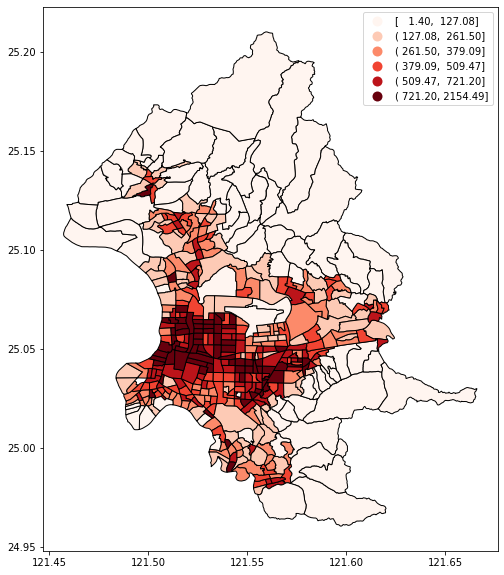

In [23]:

fig, ax = plt.subplots(figsize = (12,10))
accident_vill.plot(ax=ax, column= 'accident density',cmap='Reds',scheme = 'quantiles', edgecolor = 'black',k=6,legend=True)

### 大安區事故

In [24]:
Daan = accident_vill[accident_vill['TOWNNAME']=='大安區']
Daan = Daan.set_crs(epsg=4326)
Daan_accident = gpd.clip(accident,Daan).reset_index()
XY=[]
for i in range(len(Daan_accident)):
    XY.append([Daan_accident.Y[i],Daan_accident.X[i]])

In [25]:
m = folium.Map(location=[25.047, 121.540], zoom_start=12)
m.add_child(MarkerCluster(XY))

### 同樣可以使用folium 展現面量圖

In [26]:
accident_vill = accident_vill.set_crs(epsg=4326)

In [27]:
import numpy as np
interval = []
#min(accident_vill['accident density'])
for i in range(7):
    interval.append(round(np.quantile(accident_vill['accident density'],i/6),2))
interval

[1.4, 127.08, 261.5, 379.09, 509.47, 721.2, 2154.49]

In [28]:
import branca.colormap as cmp
step = cmp.StepColormap(
 ['#FFF5F0', '#FDCAB5', '#FC8A6A','#F14432','#BC141A','#67000D'],
 vmin=interval[0], vmax=interval[-1],
 index=interval,  #for change in the colors, not used fr linear
 caption='Color Scale for Map'    #Caption for Color scale or Legend
)
step

In [29]:
TP_map = folium.Map(location=[25.12, 121.57], zoom_start=12)
folium.GeoJson(
    accident_vill,popup=folium.GeoJsonPopup(fields=['VILLNAME']),
    style_function=lambda feature: {
        "fillColor":  step(feature["properties"]["accident density"]),
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5",
        "fillOpacity": 0.9
    }
).add_to(TP_map)

step.caption = "Traffic Accident in village"
step.add_to(TP_map)

TP_map

In [30]:
import branca.colormap as cm

colormap = cm.LinearColormap(colors=['#81C7D4','#CB4042'],vmin= accident_vill['accident density'].min(), vmax =accident_vill['accident density'].max())
print(colormap(5.0))

colormap

#81c7d4ff


In [31]:
TP_map = folium.Map(location=[25.12, 121.57], zoom_start=12)
folium.GeoJson(
    accident_vill,popup=folium.GeoJsonPopup(fields=['VILLNAME']),name='TP_accident',
    style_function=lambda feature: {
        "fillColor":  colormap(feature["properties"]["accident density"]),
        "color": "black",
        "weight": 1,
        "dashArray": "5, 5",
        "fillOpacity": 0.9
    }
).add_to(TP_map)

colormap.caption = "Traffic Accident in village"
colormap.add_to(TP_map)
folium.LayerControl().add_to(TP_map)
TP_map
#TP_map.save('map.html')